# Predict Customer Personality to Boost Marketing Campaign by Using Machine Learning

## Background
A company can develop rapidly when it knows its customers' personalities and behaviors, so it can provide better services and benefits to customers who have the potential to become loyal customers. Our focus is to create a cluster prediction model to make it easier for companies to make decisions by processing historical marketing campaign data to improve performance and target the right customers so they can transact on the company's platform.

“Sebuah perusahaan dapat berkembang dengan pesat saat mengetahui perilaku customer personality nya, sehingga dapat memberikan layanan serta manfaat lebih baik kepada customers yang berpotensi menjadi loyal customers. Dengan mengolah data historical marketing campaign guna menaikkan performa dan menyasar customers yang tepat agar dapat bertransaksi di platform perusahaan, dari insight data tersebut fokus kita adalah membuat sebuah model prediksi kluster sehingga memudahkan perusahaan dalam membuat keputusan ”


In [1]:
#import library
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.style as style

import datetime as dt
from datetime import date

from dataprep.eda import plot_missing
from dataprep.eda import create_report

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA 
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler

## STAGE 1: CREATE SOME FEATURES & EDA

In [2]:
df =  pd.read_csv('marketing_campaign_data.csv')
df.head(5)

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,0,5524,1957,S1,Lajang,58138000.0,0,0,04-09-2012,58,...,7,0,0,0,0,0,0,3,11,1
1,1,2174,1954,S1,Lajang,46344000.0,1,1,08-03-2014,38,...,5,0,0,0,0,0,0,3,11,0
2,2,4141,1965,S1,Bertunangan,71613000.0,0,0,21-08-2013,26,...,4,0,0,0,0,0,0,3,11,0
3,3,6182,1984,S1,Bertunangan,26646000.0,1,0,10-02-2014,26,...,6,0,0,0,0,0,0,3,11,0
4,4,5324,1981,S3,Menikah,58293000.0,1,0,19-01-2014,94,...,5,0,0,0,0,0,0,3,11,0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           2240 non-null   int64  
 1   ID                   2240 non-null   int64  
 2   Year_Birth           2240 non-null   int64  
 3   Education            2240 non-null   object 
 4   Marital_Status       2240 non-null   object 
 5   Income               2216 non-null   float64
 6   Kidhome              2240 non-null   int64  
 7   Teenhome             2240 non-null   int64  
 8   Dt_Customer          2240 non-null   object 
 9   Recency              2240 non-null   int64  
 10  MntCoke              2240 non-null   int64  
 11  MntFruits            2240 non-null   int64  
 12  MntMeatProducts      2240 non-null   int64  
 13  MntFishProducts      2240 non-null   int64  
 14  MntSweetProducts     2240 non-null   int64  
 15  MntGoldProds         2240 non-null   i

we will use dataprep library for EDA.

  0%|          | 0/292 [00:00<?, ?it/s]


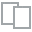
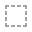
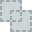
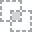
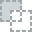
...
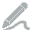
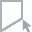
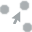
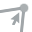
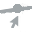

In [4]:
plot_missing(df)

we will drop `Unnamed: 0` column because we already have `ID` column and we will drop missing values because it's only 24 rows.

In [5]:
df = df.drop('Unnamed: 0', axis=1)
df_clear = df.dropna()

let's we check duplicate values

In [6]:
df_clear.duplicated().sum()

0

there is no duplicate values

In [7]:
df_clear.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2216 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2216 non-null   int64  
 1   Year_Birth           2216 non-null   int64  
 2   Education            2216 non-null   object 
 3   Marital_Status       2216 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2216 non-null   int64  
 6   Teenhome             2216 non-null   int64  
 7   Dt_Customer          2216 non-null   object 
 8   Recency              2216 non-null   int64  
 9   MntCoke              2216 non-null   int64  
 10  MntFruits            2216 non-null   int64  
 11  MntMeatProducts      2216 non-null   int64  
 12  MntFishProducts      2216 non-null   int64  
 13  MntSweetProducts     2216 non-null   int64  
 14  MntGoldProds         2216 non-null   int64  
 15  NumDealsPurchases    2216 non-null   i

we should change the data type of `Dt_Customer` to datetime instead of object

In [8]:
#change Dt_Customer dtype from object to datetime 64[ns]
df_clear['Dt_Customer'] = pd.to_datetime(df_clear['Dt_Customer'])

In [9]:
df_clear['Dt_Customer'].info()

<class 'pandas.core.series.Series'>
Int64Index: 2216 entries, 0 to 2239
Series name: Dt_Customer
Non-Null Count  Dtype         
--------------  -----         
2216 non-null   datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 34.6 KB


### Create some features

Let's make features from the data.
1. `conversion_rate`: we will make it from (responses / visit) customer history. 
2. `age` :  from `Year_Birth` - now.
3. number of children (`noc`): from `Kidhome` + `Teenhome`.
4. Total money spent `total_spent`: from `MntCoke` + `MntFruits` + `MntMeatProducts` + `MntFishProducts` + ` MntSweetProducts` + `MntGoldProds`
5. Total transaction `total_transaction` : from `NumDealsPurchases ` + `NumWebPurchases` + `NumCatalogPurchases` + `NumStorePurchases`
6. Total of days joined (`days`)  : now - `Dt_Customer`

In [10]:
#create total purchases feature
# function for create conversion rate
def cvr(x,y):
    if y == 0:
        return 0
    return x/y

#make total_puchases column for purpose
df_clear['total_transaction'] = df_clear['NumDealsPurchases']+df_clear['NumWebPurchases']+df_clear['NumCatalogPurchases']+df_clear['NumStorePurchases']
# for visit we will use NumWebVisitsMonth
df_clear['conversion_rate'] =  df_clear.apply(lambda x: cvr(x['total_transaction'], x['NumWebVisitsMonth']), axis=1)

In [11]:
# create age column
df_clear['age'] = 2022 - df_clear['Year_Birth']

#create feature number of children column
df_clear['noc'] = df_clear['Kidhome'] + df_clear['Teenhome']

#create feature total money spent  column
df_clear['total_spent'] = df_clear['MntCoke'] + df_clear['MntFruits'] + df_clear['MntMeatProducts'] + df_clear['MntFishProducts'] + df_clear['MntSweetProducts'] + df_clear['MntGoldProds']

#create total days of joined column
df_clear['today'] = date.today()
df_clear['today'] = df_clear['today'].astype('datetime64[ns]')
df_clear['days'] = (df_clear['today'] - df_clear['Dt_Customer']).dt.days

In [12]:
df_clear.head(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,...,Z_CostContact,Z_Revenue,Response,total_transaction,conversion_rate,age,noc,total_spent,today,days
0,5524,1957,S1,Lajang,58138000.0,0,0,2012-04-09,58,635000,...,3,11,1,25,3.571429,65,0,1617000,2023-01-01,3919
1,2174,1954,S1,Lajang,46344000.0,1,1,2014-08-03,38,11000,...,3,11,0,6,1.200000,68,2,27000,2023-01-01,3073
2,4141,1965,S1,Bertunangan,71613000.0,0,0,2013-08-21,26,426000,...,3,11,0,21,5.250000,57,0,776000,2023-01-01,3420
3,6182,1984,S1,Bertunangan,26646000.0,1,0,2014-10-02,26,11000,...,3,11,0,8,1.333333,38,1,53000,2023-01-01,3013
4,5324,1981,S3,Menikah,58293000.0,1,0,2014-01-19,94,173000,...,3,11,0,19,3.800000,41,1,422000,2023-01-01,3269


Because all data is unique and for further analysis we don't need 'ID', this column will be deleted.In addition, we will also delete several columns such as 'Year_birth', and 'Todays'.

In [13]:
df_clear = df_clear.drop(['ID','Year_Birth','today'], axis=1)
df_clear.head(5)

,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,...,Complain,Z_CostContact,Z_Revenue,Response,total_transaction,conversion_rate,age,noc,total_spent,days
0,S1,Lajang,58138000.0,0,0,2012-04-09,58,635000,88000,546000,...,0,3,11,1,25,3.571429,65,0,1617000,3919
1,S1,Lajang,46344000.0,1,1,2014-08-03,38,11000,1000,6000,...,0,3,11,0,6,1.200000,68,2,27000,3073
2,S1,Bertunangan,71613000.0,0,0,2013-08-21,26,426000,49000,127000,...,0,3,11,0,21,5.250000,57,0,776000,3420
3,S1,Bertunangan,26646000.0,1,0,2014-10-02,26,11000,4000,20000,...,0,3,11,0,8,1.333333,38,1,53000,3013
4,S3,Menikah,58293000.0,1,0,2014-01-19,94,173000,43000,118000,...,0,3,11,0,19,3.800000,41,1,422000,3269


In [14]:
df_clear.describe()

,Income,Kidhome,Teenhome,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,Complain,Z_CostContact,Z_Revenue,Response,total_transaction,conversion_rate,age,noc,total_spent,days
count,2.216000e+03,2216.000000,2216.000000,2216.000000,2.216000e+03,2216.000000,2.216000e+03,2216.000000,2216.000000,2216.000000,...,2216.000000,2216.0,2216.0,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2.216000e+03,2216.000000
mean,5.224725e+07,0.441787,0.505415,49.012635,3.050916e+05,26356.046931,1.669959e+05,37637.635379,27028.880866,43965.252708,...,0.009477,3.0,11.0,0.150271,14.880866,4.390755,53.179603,0.947202,6.070754e+05,3460.006318
std,2.517308e+07,0.536896,0.544181,28.948352,3.373279e+05,39793.916518,2.242833e+05,54752.082415,41072.045667,51815.414374,...,0.096907,0.0,0.0,0.357417,7.670957,4.888816,11.985554,0.749062,6.029005e+05,232.469034
min,1.730000e+06,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000,...,0.000000,3.0,11.0,0.000000,0.000000,0.000000,26.000000,0.000000,5.000000e+03,2948.000000
25%,3.530300e+07,0.000000,0.000000,24.000000,2.400000e+04,2000.000000,1.600000e+04,3000.000000,1000.000000,9000.000000,...,0.000000,3.0,11.0,0.000000,8.000000,1.222222,45.000000,0.000000,6.900000e+04,3288.000000
50%,5.138150e+07,0.000000,0.000000,49.000000,1.745000e+05,8000.000000,6.800000e+04,12000.000000,8000.000000,24500.000000,...,0.000000,3.0,11.0,0.000000,15.000000,2.612500,52.000000,1.000000,3.965000e+05,3461.000000
75%,6.852200e+07,1.000000,1.000000,74.000000,5.050000e+05,33000.000000,2.322500e+05,50000.000000,33000.000000,56000.000000,...,0.000000,3.0,11.0,0.000000,21.000000,5.400000,63.000000,1.000000,1.048000e+06,3634.000000
max,6.666660e+08,2.000000,2.000000,99.000000,1.493000e+06,199000.000000,1.725000e+06,259000.000000,262000.000000,321000.000000,...,1.000000,3.0,11.0,1.000000,44.000000,43.000000,129.000000,3.000000,2.525000e+06,4011.000000


min, max, std, median dijelaskan.

Let's make a column to group customers based on their age.This column we call `age_group`). Before that let's we check customer age > 90 years.

In [15]:
adf_g = df_clear[df_clear['age']>90]
adf_g

,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,...,Complain,Z_CostContact,Z_Revenue,Response,total_transaction,conversion_rate,age,noc,total_spent,days
192,D3,Cerai,36640000.0,1,0,2013-09-26,99,15000,6000,8000,...,1,3,11,0,6,1.2,122,1,65000,3384
239,D3,Lajang,60182000.0,0,1,2014-05-17,23,8000,0,5000,...,0,3,11,0,4,1.0,129,1,22000,3151
339,S3,Bertunangan,83532000.0,0,0,2013-09-26,36,755000,144000,562000,...,0,3,11,0,15,15.0,123,0,1853000,3384


so we hav 3 customers with >80 years. But we will not drop this because we asume that their account can be used by their family member. Let's we grouping the customer ages. (from statistica descriptive we know that the minimum of customer ages is 26 years old.)

25–44: Prime Adulthood  
45–54: Younger Middle-Age  
55–64: Older Middle-Age/Early Senior Years  
65–74: Middle Senior/Early Elderly Years  
75–84: Late Senior/Middle Elderly Years  
85+: Late Elderly/Geriatric Years

In [16]:
age_list=[]
for i in df_clear['age']:
    if i <= 44:
        group = 'Prime Adulthood'
    elif i <= 54:
        group = 'Younger Middle-Age'
    elif i <= 64:
        group = 'Older Middle-Age'
    elif i <= 74:
        group = 'Middle Senior'
    elif i <= 84:
        group = 'Late Senior'
    else:
        group = 'Late Elderly'
    age_list.append(group)
    
df_clear['age_group'] = age_list

In [17]:
df_eda = df_clear.copy()
df_eda.head(5)

,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,...,Z_CostContact,Z_Revenue,Response,total_transaction,conversion_rate,age,noc,total_spent,days,age_group
0,S1,Lajang,58138000.0,0,0,2012-04-09,58,635000,88000,546000,...,3,11,1,25,3.571429,65,0,1617000,3919,Middle Senior
1,S1,Lajang,46344000.0,1,1,2014-08-03,38,11000,1000,6000,...,3,11,0,6,1.200000,68,2,27000,3073,Middle Senior
2,S1,Bertunangan,71613000.0,0,0,2013-08-21,26,426000,49000,127000,...,3,11,0,21,5.250000,57,0,776000,3420,Older Middle-Age
3,S1,Bertunangan,26646000.0,1,0,2014-10-02,26,11000,4000,20000,...,3,11,0,8,1.333333,38,1,53000,3013,Prime Adulthood
4,S3,Menikah,58293000.0,1,0,2014-01-19,94,173000,43000,118000,...,3,11,0,19,3.800000,41,1,422000,3269,Prime Adulthood


In [18]:
df_eda.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2216 entries, 0 to 2239
Data columns (total 34 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Education            2216 non-null   object        
 1   Marital_Status       2216 non-null   object        
 2   Income               2216 non-null   float64       
 3   Kidhome              2216 non-null   int64         
 4   Teenhome             2216 non-null   int64         
 5   Dt_Customer          2216 non-null   datetime64[ns]
 6   Recency              2216 non-null   int64         
 7   MntCoke              2216 non-null   int64         
 8   MntFruits            2216 non-null   int64         
 9   MntMeatProducts      2216 non-null   int64         
 10  MntFishProducts      2216 non-null   int64         
 11  MntSweetProducts     2216 non-null   int64         
 12  MntGoldProds         2216 non-null   int64         
 13  NumDealsPurchases    2216 non-nul

In [19]:
list_cats = list(df_eda.select_dtypes(include='object'))
list_nums = list(df_eda.select_dtypes(include=['float64','int64']))
list_date =  list(df_eda.select_dtypes(include='datetime64[ns]'))
print('List Categorical Data : ',len(list_cats))
print(list_cats)
print('**'*82)
print('List Numerical Data:', len(list_nums))
print(list_nums)
print('**'*82)
print('List Datetime Data')
print(list_date)

List Categorical Data :  3
['Education', 'Marital_Status', 'age_group']
********************************************************************************************************************************************************************
List Numerical Data: 30
['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response', 'total_transaction', 'conversion_rate', 'age', 'noc', 'total_spent', 'days']
********************************************************************************************************************************************************************
List Datetime Data
['Dt_Customer']


In [20]:
# Melakukan value count untuk setiap kolom numerik
for i in list_nums:
    print(f"\nValue count kolom {i}:\n{20*'-'}")
    print(df_eda[i].value_counts())


Value count kolom Income:
--------------------
7500000.0     12
35860000.0     4
37760000.0     3
83844000.0     3
63841000.0     3
              ..
40760000.0     1
41452000.0     1
6835000.0      1
33622000.0     1
52869000.0     1
Name: Income, Length: 1974, dtype: int64

Value count kolom Kidhome:
--------------------
0    1283
1     887
2      46
Name: Kidhome, dtype: int64

Value count kolom Teenhome:
--------------------
0    1147
1    1018
2      51
Name: Teenhome, dtype: int64

Value count kolom Recency:
--------------------
56    37
30    32
54    32
46    31
92    30
      ..
41    15
59    14
22    13
7     12
44    11
Name: Recency, Length: 100, dtype: int64

Value count kolom MntCoke:
--------------------
2000       42
1000       37
6000       37
5000       37
4000       33
           ..
986000      1
1230000     1
248000      1
1241000     1
428000      1
Name: MntCoke, Length: 776, dtype: int64

Value count kolom MntFruits:
--------------------
0         395
1000      

In [21]:
# Melakukan value count untuk setiap kolom kategori
for i in list_cats:
    print(f"\nValue count kolom {i}:\n{20*'-'}")
    print(df_eda[i].value_counts())


Value count kolom Education:
--------------------
S1     1116
S3      481
S2      365
D3      200
SMA      54
Name: Education, dtype: int64

Value count kolom Marital_Status:
--------------------
Menikah        857
Bertunangan    573
Lajang         475
Cerai          232
Janda           76
Duda             3
Name: Marital_Status, dtype: int64

Value count kolom age_group:
--------------------
Younger Middle-Age    725
Prime Adulthood       548
Older Middle-Age      483
Middle Senior         402
Late Senior            55
Late Elderly            3
Name: age_group, dtype: int64


We can drop `Z_CostContact` and `Z_Revenue` because these column only have one value.

In [22]:
df_eda = df_eda.drop(['Z_CostContact','Z_Revenue'], axis=1)

let's we define again the list of numerical dataa

In [23]:
list_cats = list(df_eda.select_dtypes(include='object'))
list_nums = list(df_eda.select_dtypes(include=['float64','int64']))
list_date =  list(df_eda.select_dtypes(include='datetime64[ns]'))
print('List Categorical Data : ',len(list_cats))
print(list_cats)
print('**'*82)
print('List Numerical Data:', len(list_nums))
print(list_nums)
print('**'*82)
print('List Datetime Data')
print(list_date)

List Categorical Data :  3
['Education', 'Marital_Status', 'age_group']
********************************************************************************************************************************************************************
List Numerical Data: 28
['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'total_transaction', 'conversion_rate', 'age', 'noc', 'total_spent', 'days']
********************************************************************************************************************************************************************
List Datetime Data
['Dt_Customer']


In [24]:
nums1 = list_nums[0:14]
nums2 = list_nums[15:29]

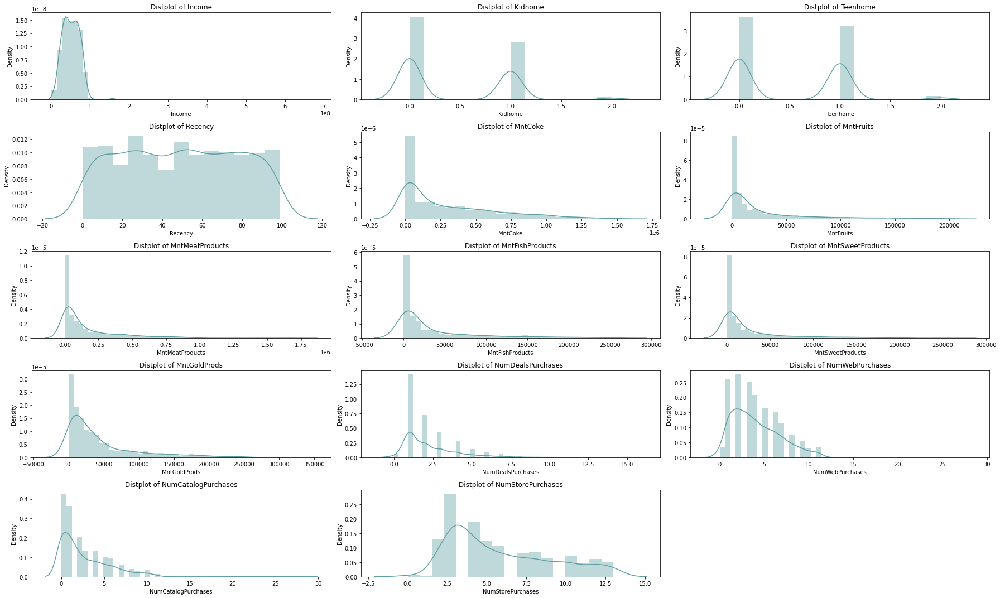

In [25]:
# Membuat distplot untuk seluruh numerical features
plt.figure(figsize=(25, 15))
for i in range(0, len(nums1)):
    plt.subplot(5,3, i+1)
    sns.distplot(df_eda[nums1[i]], color='cadetblue')
    plt.title('Distplot of {}'.format(nums1[i]))
    plt.tight_layout()
plt.show()

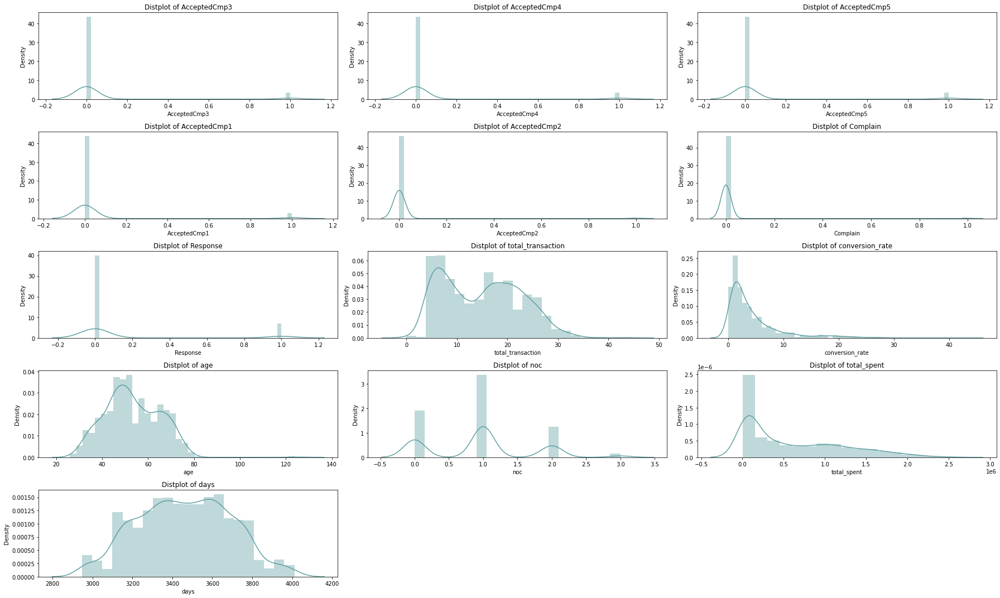

In [26]:
# Membuat distplot untuk seluruh numerical features
plt.figure(figsize=(25, 15))
for i in range(0, len(nums2)):
    plt.subplot(5,3, i+1)
    sns.distplot(df_eda[nums2[i]], color='cadetblue')
    plt.title('Distplot of {}'.format(nums2[i]))
    plt.tight_layout()
plt.show()

In [27]:
#skewness value
for i in range(0, len(list_nums)):
    print(f"Skewness {df_eda[list_nums].columns[i]} : {df_eda[list_nums[i]].skew()}")

Skewness Income : 6.763487372811117
Skewness Kidhome : 0.6356100646634026
Skewness Teenhome : 0.40755280239070707
Skewness Recency : 0.0016477067463847978
Skewness MntCoke : 1.1707200955543913
Skewness MntFruits : 2.101657525150595
Skewness MntMeatProducts : 2.0255768067844637
Skewness MntFishProducts : 1.916368950232168
Skewness MntSweetProducts : 2.1033275863706797
Skewness MntGoldProds : 1.839230936129571
Skewness NumDealsPurchases : 2.415271762315824
Skewness NumWebPurchases : 1.1970370130708343
Skewness NumCatalogPurchases : 1.8810750511540515
Skewness NumStorePurchases : 0.7018262973284631
Skewness NumWebVisitsMonth : 0.2180430456390019
Skewness AcceptedCmp3 : 3.2693969568782
Skewness AcceptedCmp4 : 3.256758193853604
Skewness AcceptedCmp5 : 3.2821432492590605
Skewness AcceptedCmp1 : 3.5624821800168314
Skewness AcceptedCmp2 : 8.424753003647503
Skewness Complain : 10.132736682249801
Skewness Response : 1.9587479194384483
Skewness total_transaction : 0.25093607541663454
Skewness con

Dari plot distribusi dapat diketahui bahwa fitur kategori bersifata skew positif. Namun nilai skew dari fitur-fitur tersebut tidak begitu besar hanya saja pada fitur `Complain` yang memiliki nilai skew yang mencapai 10.

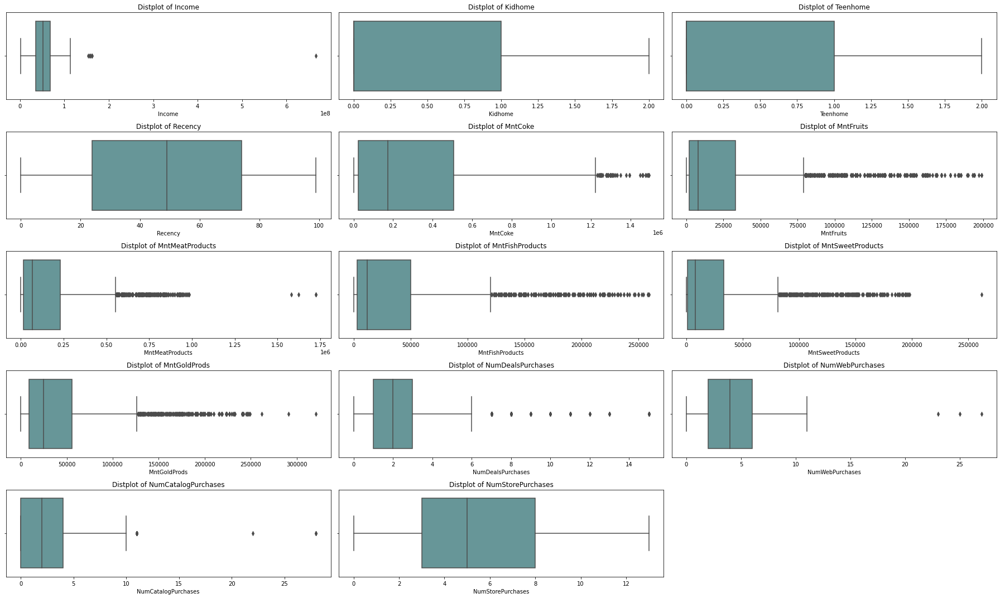

In [28]:
#boxplot
# Membuat boxplot untuk seluruh numerical features
plt.figure(figsize=(25, 15))
for i in range(0, len(nums1)):
    plt.subplot(5,3, i+1)
    sns.boxplot(df_eda[nums1[i]], color='cadetblue')
    plt.title('Distplot of {}'.format(nums1[i]))
    plt.tight_layout()
plt.show()

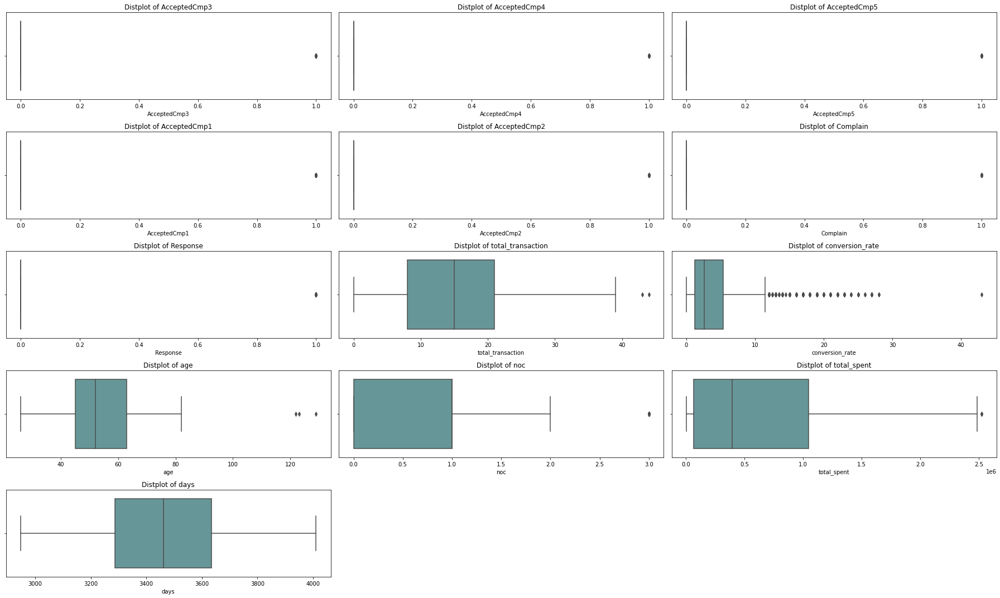

In [29]:
# Membuat boxplot untuk seluruh numerical features
plt.figure(figsize=(25, 15))
for i in range(0, len(nums2)):
    plt.subplot(5,3, i+1)
    sns.boxplot(df_eda[nums2[i]], color='cadetblue')
    plt.title('Distplot of {}'.format(nums2[i]))
    plt.tight_layout()
plt.show()

Dari boxplot dapat diketahui bahwa ada oulier yang ditemukan pada data. Kemudian pada data `AcceptedCmpx` termasuk fitur `Complain` yang memiliki plot yang aneh karena pada dasarnya hal fitur tersebut besifata boolean yaitu bernilai 0 atau 1. Sehingga pada plot distribui dan boxplot terlihat aneh.

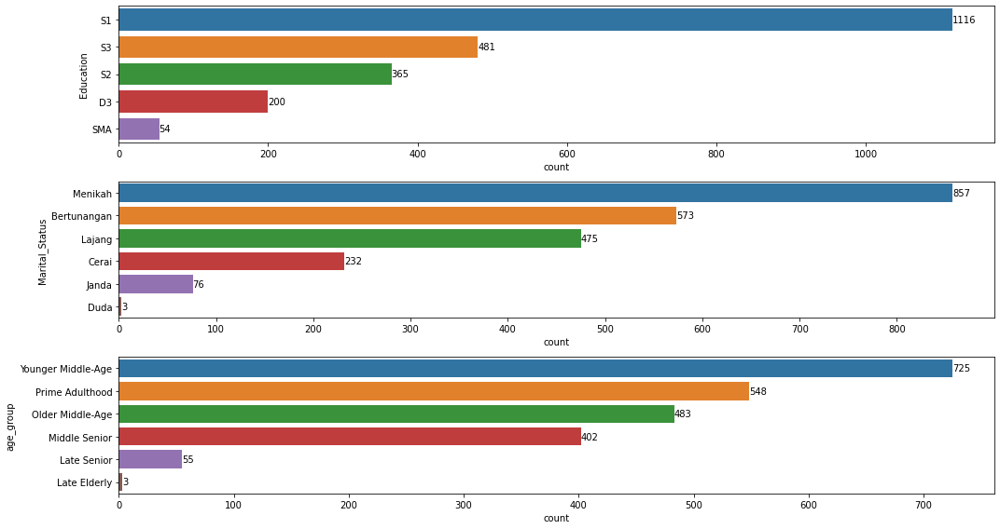

In [30]:
### barplot for categorical feature
plt.figure(figsize=(15, 8))
for i in range(len(list_cats)):
    plt.subplot(3, 1, i+1)
    ax = sns.countplot(y=list_cats[i], data=df_eda, order=df_eda[list_cats[i]].value_counts().index)
    plt.bar_label(ax.containers[0])
    plt.tight_layout()

* Berdasarkan jenjang pendidikan, kebanyakan kustomer merupakan lulusan S1
* Berdasarkan status pernikahan, kebanyakan kustomer sudah menikah
* Berdasarkan kelompok usia, kebanyakan kostumer merupakan kelompok usia Young Middle Age (45–54 tahun)

In [31]:
df_eda[list_date].describe()

,Dt_Customer
count,2216
unique,662
top,2012-08-31 00:00:00
freq,12
first,2012-01-08 00:00:00
last,2014-12-06 00:00:00


* kebanyakan kostumer bergabung pada tanggal 31 September 2012
* tanggal awal kustomer pertama bergabung adalah tanggal 8 Januari 2012
* tanggal dari kustomer terakhir bergabung adalah tanggal 6 Desember 2014

<AxesSubplot: >

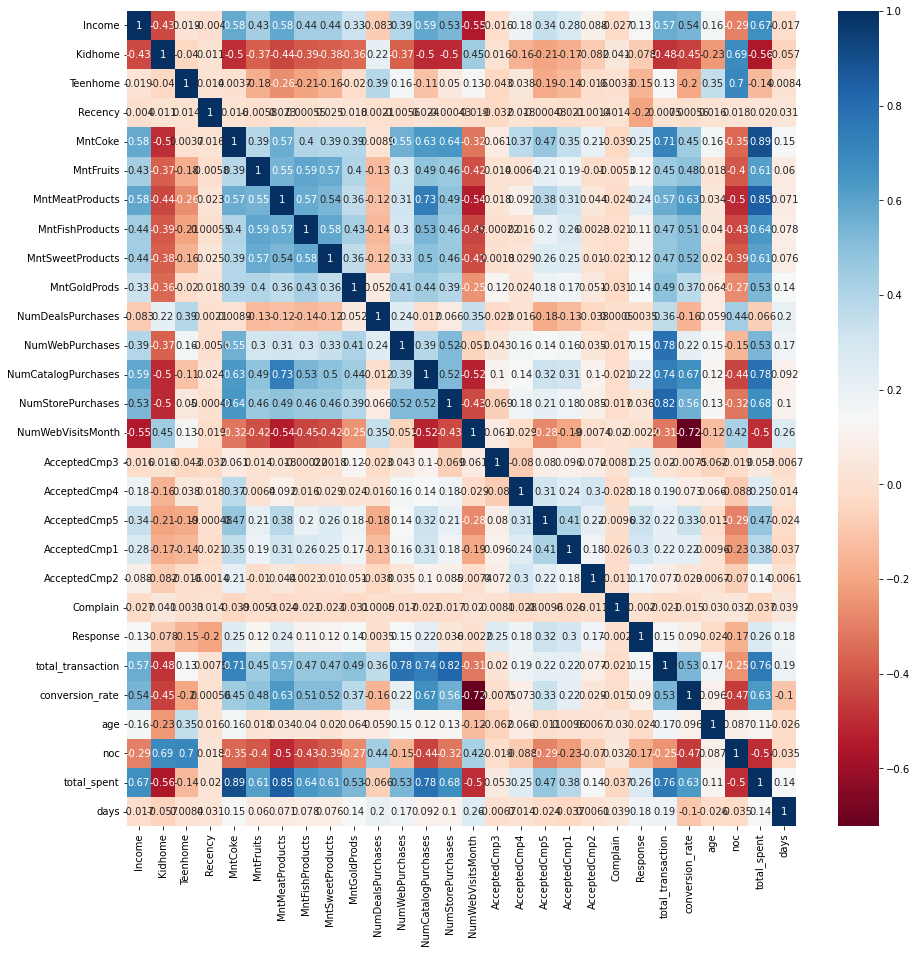

In [32]:
plt.figure(figsize=(15,15))
sns.heatmap(df_eda.corr(), cmap="RdBu", annot=True)

In [33]:
corr = df_eda.corr()
m = (corr.mask(np.eye(len(corr), dtype=bool)) >= 0.7).any()
raw = corr.loc[m, m]
raw

,MntCoke,MntMeatProducts,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,total_transaction,total_spent
MntCoke,1.000000,0.568860,0.553786,0.634753,0.640012,0.713508,0.893136
MntMeatProducts,0.568860,1.000000,0.307090,0.734127,0.486006,0.565360,0.845884
NumWebPurchases,0.553786,0.307090,1.000000,0.386868,0.516240,0.784238,0.528973
NumCatalogPurchases,0.634753,0.734127,0.386868,1.000000,0.517840,0.736179,0.780482
NumStorePurchases,0.640012,0.486006,0.516240,0.517840,1.000000,0.822391,0.675181
total_transaction,0.713508,0.565360,0.784238,0.736179,0.822391,1.000000,0.756403
total_spent,0.893136,0.845884,0.528973,0.780482,0.675181,0.756403,1.000000


In [34]:
corr = df_eda.corr()
m = (corr.mask(np.eye(len(corr), dtype=bool)) <= -0.7).any()
raw = corr.loc[m, m]
raw

,NumWebVisitsMonth,conversion_rate
NumWebVisitsMonth,1.000000,-0.722706
conversion_rate,-0.722706,1.000000


Dari informasi di atas dapat diketahui bahwa terdapat beberapa fitur yang memiliki nilai korelasi lebih dari 0.7 dan -0.7. Salah satu hal yang pasti adalah semakin banyak pembelian yang dilakukan `Purchase` maka `total_spent` juga akan semakin tinggi. Hal menarik di sini adalah jumlah mengunjungi website ternyata berbanding terbalik dengan conversion rate. Hal ini mungkin customer hanya melihat-lihat produk tanpa melakukan pembelian.

### Insight

Insight yang akan dicari adalah sebagai berikut:
* hubungan `age` atau `age_group` terhadap `conversion_rate`, `income`, `total_spent`, `recency`.
* hubungan antara `NumWebVisitsMonth` vs `conversion_rate` secara visual. 
* hubungan antara `income` vs `conversion_rate`.

In [35]:
# Rasio conversion_rate berdasarkan age_group
cvr_age = df_eda.groupby('age_group').agg({'conversion_rate':'sum'}).reset_index().sort_values(by='conversion_rate',ascending=False)
cvr_age['percentage'] = round((cvr_age['conversion_rate'] /
                            cvr_age['conversion_rate'].sum())*100,2)
cvr_age

,age_group,conversion_rate,percentage
5,Younger Middle-Age,2704.923748,27.80
4,Prime Adulthood,2323.481578,23.88
3,Older Middle-Age,2214.879950,22.76
2,Middle Senior,2042.869048,21.00
1,Late Senior,426.558333,4.38
0,Late Elderly,17.200000,0.18


In [36]:
ag = pd.DataFrame(df_eda['age_group'].value_counts()).reset_index()
ag.columns = ['group','counts']
ag

,group,counts
0,Younger Middle-Age,725
1,Prime Adulthood,548
2,Older Middle-Age,483
3,Middle Senior,402
4,Late Senior,55
5,Late Elderly,3


(0.0, 30.0)

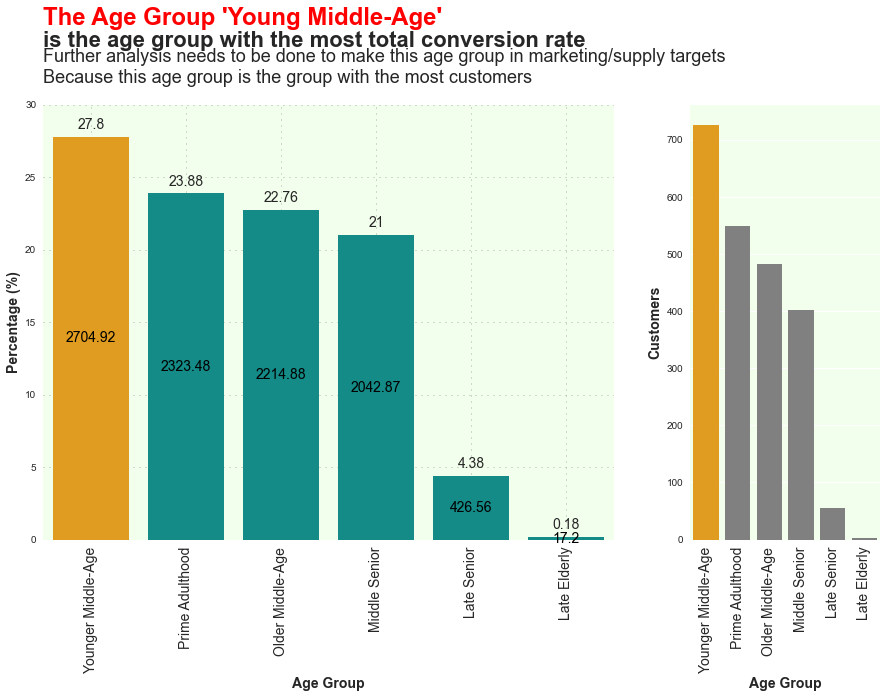

In [37]:
style.use('seaborn')
fig, ax = plt.subplots(1,2, figsize=(15, 8), gridspec_kw={'width_ratios': [3, 1]})

cols1 = ['#009f99' if (x < max(cvr_age.percentage)) else 'orange' for x in cvr_age.percentage]
cols2 = ['gray' if (x < max(ag.counts)) else 'orange' for x in ag.counts]

sns.barplot(ax=ax[0], x='age_group', y='percentage', data=cvr_age, palette=cols1)
sns.barplot(ax=ax[1], x='group', y='counts', data=ag, palette=cols2)

ax[0].tick_params(axis='x', which='major', labelsize=14, labelrotation=90)
ax[1].tick_params(axis='x', which='major', labelsize=14, labelrotation=90)


ax[0].set_facecolor('#f3ffed')
ax[1].set_facecolor('#f3ffed')

ax[0].grid(which="major", axis="y", zorder=0, color="gray", linestyle=":", dashes=(1, 5), alpha=0.6)
ax[0].grid(which="major", axis="x", zorder=0, color="gray", linestyle=":", dashes=(1, 5), alpha=0.6)

ax[0].text(x=-0.5, y=35.5, s="The Age Group 'Young Middle-Age'", fontsize=24, fontweight='bold', c='red')
ax[0].text(x=-0.5, y=34, s="is the age group with the most total conversion rate ", fontsize=22, fontweight='bold')
ax[0].text(x=-0.5, y=31.5, s="Further analysis needs to be done to make this age group in marketing/supply targets\nBecause this age group is the group with the most customers", fontsize=18)

ax[0].bar_label(ax[0].containers[0], fontsize=14, padding=5)
ax[0].bar_label(ax[0].containers[0],list(round(cvr_age['conversion_rate'],2)), label_type='center', color='black', fontsize=14)

ax[0].set_xlabel('Age Group', fontsize=14, fontweight='bold')
ax[0].set_ylabel('Percentage (%)', fontsize=14, fontweight='bold')
ax[1].set_xlabel('Age Group', fontsize=14, fontweight='bold')
ax[1].set_ylabel('Customers', fontsize=14, fontweight='bold')

ax[0].set_ylim(0, 30)
# plt.tight_layout()

In [38]:
df_eda['age_group'].value_counts()

Younger Middle-Age    725
Prime Adulthood       548
Older Middle-Age      483
Middle Senior         402
Late Senior            55
Late Elderly            3
Name: age_group, dtype: int64

In [39]:
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


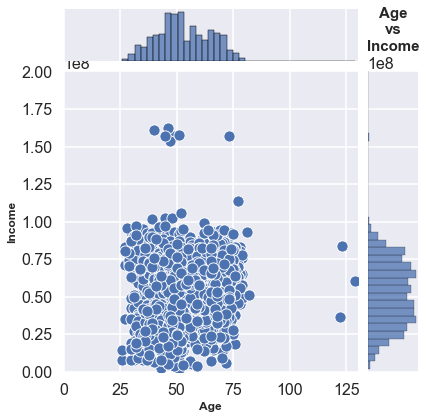

In [40]:
# age vs income
style.use('seaborn-v0_8-poster')
plot = sns.jointplot(x = "age", y = "Income",
              kind = "scatter", data = df_eda,
              dropna = True)
plt.title('Age\nvs\nIncome', fontsize=15, weight='bold')
plot.ax_marg_x.set_xlim(0, 130)
plot.ax_marg_y.set_ylim(0, 200000000)
plot.ax_joint.set_xlabel('Age', fontweight='bold', fontsize=12)
plot.ax_joint.set_ylabel('Income', fontweight='bold', fontsize=12)
plot.figure.tight_layout() 

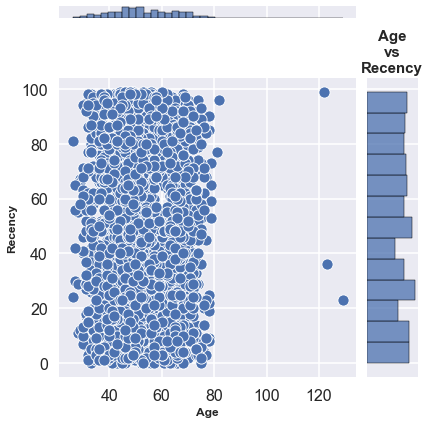

In [41]:
# age vs recency
style.use('seaborn-v0_8-poster')
plot = sns.jointplot(x = "age", y = "Recency",
              kind = "scatter", data = df_eda,
              dropna = True)
plt.title('Age\nvs\nRecency', fontsize=15, weight='bold')
# plot.ax_marg_x.set_xlim(0, 130)
# plot.ax_marg_y.set_ylim(0, 200000000)
plot.ax_joint.set_xlabel('Age', fontweight='bold', fontsize=12)
plot.ax_joint.set_ylabel('Recency', fontweight='bold', fontsize=12)
plot.figure.tight_layout() 

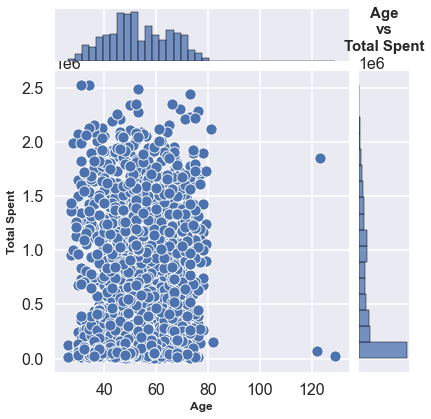

In [42]:
# age vs Total Spent
style.use('seaborn-v0_8-poster')
plot = sns.jointplot(x = "age", y = "total_spent",
              kind = "scatter", data = df_eda,
              dropna = True)
plt.title('Age\nvs\nTotal Spent', fontsize=15, weight='bold')
plot.ax_joint.set_xlabel('Age', fontweight='bold', fontsize=12)
plot.ax_joint.set_ylabel('Total Spent', fontweight='bold', fontsize=12)
plot.figure.tight_layout() 

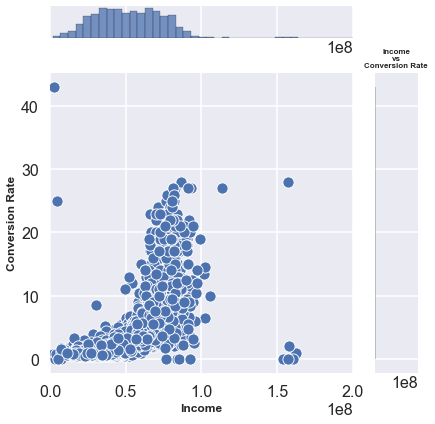

In [43]:
# income vs conversion_rate
style.use('seaborn-v0_8-poster')
plot = sns.jointplot(y = "conversion_rate", x = "Income",
              kind = "scatter", data = df_eda,
              dropna = True)
plot.ax_marg_x.set_xlim(0, 200000000)
plot.ax_marg_y.set_xlim(0, 200000000)
plot.ax_joint.set_xlabel('Income', fontweight='bold', fontsize=12)
plot.ax_joint.set_ylabel('Conversion Rate', fontweight='bold', fontsize=12)
plt.title('Income\nvs\nConversion Rate', fontsize=8, weight='bold')
plot.figure.tight_layout() 

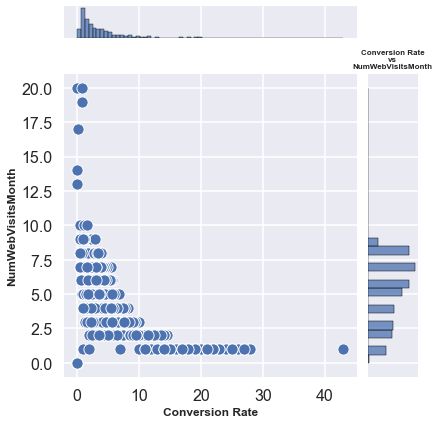

In [44]:
# income vs conversion_rate
style.use('seaborn-v0_8-poster')
plot = sns.jointplot(x = "conversion_rate", y = "NumWebVisitsMonth",
              kind = "scatter", data = df_eda,
              dropna = True)
plot.ax_joint.set_xlabel('Conversion Rate', fontweight='bold', fontsize=12)
plot.ax_joint.set_ylabel('NumWebVisitsMonth', fontweight='bold', fontsize=12)
plt.title('Conversion Rate\nvs\nNumWebVisitsMonth', fontsize=8, weight='bold')
plot.figure.tight_layout() 

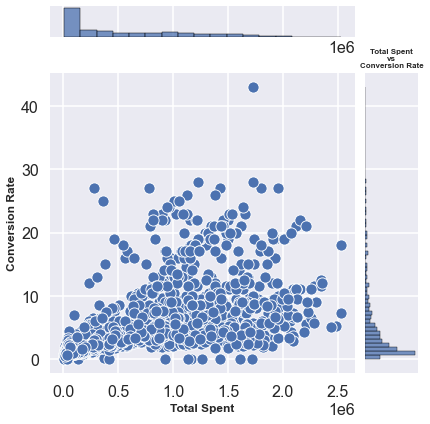

In [45]:
# income vs conversion_rate
style.use('seaborn-v0_8-poster')
plot = sns.jointplot(x = "total_spent", y = "conversion_rate",
              kind = "scatter", data = df_eda,
              dropna = True)
plot.ax_joint.set_xlabel('Total Spent', fontweight='bold', fontsize=12)
plot.ax_joint.set_ylabel('Conversion Rate', fontweight='bold', fontsize=12)
plt.title('Total Spent\nvs\nConversion Rate', fontsize=8, weight='bold')
plot.figure.tight_layout() 

## Data Preprocessing

Pada langkah sebelumnya diketahui bahwa terdapat 24 missing value pada `income` yang kemudian telah didrop. Selain itu didapakan juga bahwa tidak ada data duplicate pada dataset.

In [46]:
df_p = df_eda.copy()

In [47]:
df_p.isnull().any().sum()


0

tidak terdapat null data

#### Feature Selection
Untuk melakukan segmentasi customer digunakan metode RFM (Recency, Frequency, Monetory). Namun dalam hal ini digunakan juga `days` untuk melihat apakah pengguna baru atau bukan (L) dan age (C) dijadikan juga sebagai feature untuk segmentasi customer. Metrik dari RFM merupakan indikator penting dari perilaku pelanggan karena frequency dan monetary value mempengaruhi customer’s lifetime value dan recency mempengaruhi retention.  

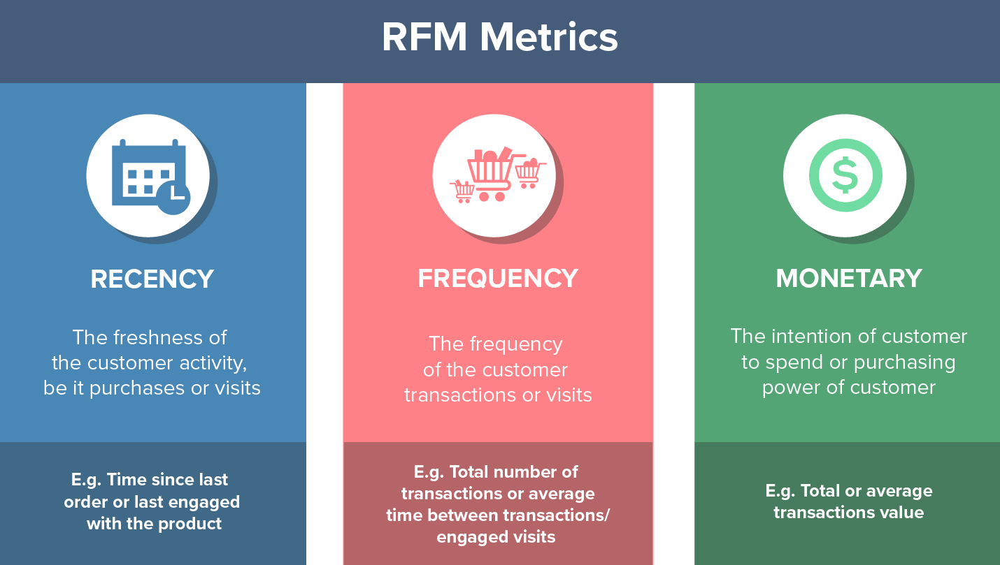

| LRFMC        | Kolom |
|:-------------|:-----|
|Loyalty  |`L = days`|
|Recency  |`R = Recency`|
|Frequency   |`F = total_transaction`|
|Monetary   |`M = total_spent `|
|Counts   |`C = age` |

In [48]:
ls_feat = ['days','Recency','total_transaction','total_spent','age']

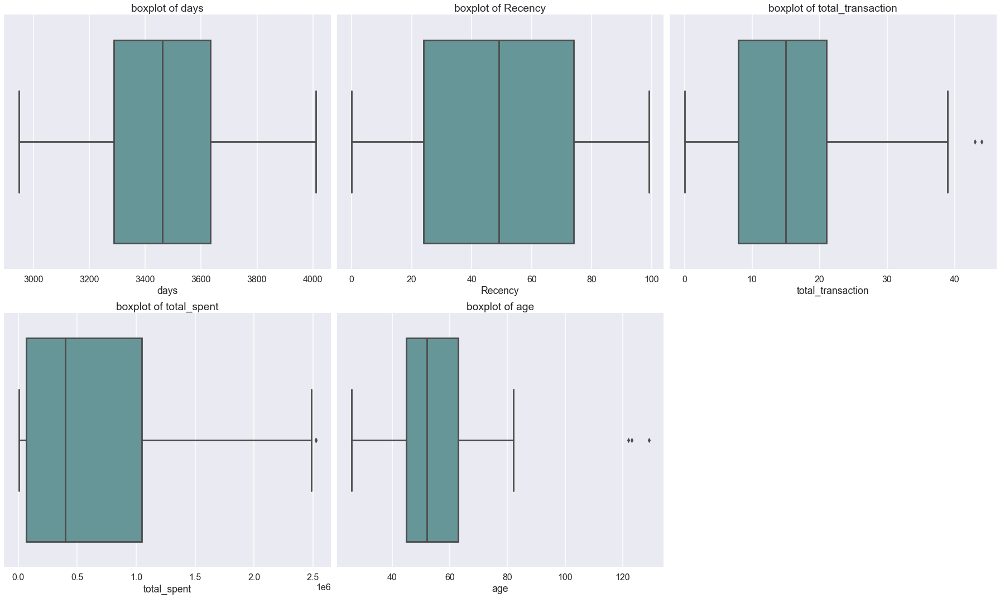

In [49]:
plt.figure(figsize=(25, 15))
for i in range(0, len(ls_feat)):
    plt.subplot(2,3, i+1)
    sns.boxplot(df_p[ls_feat[i]], color='cadetblue')
    plt.title('boxplot of {}'.format(ls_feat[i]))
    plt.tight_layout()
plt.show()

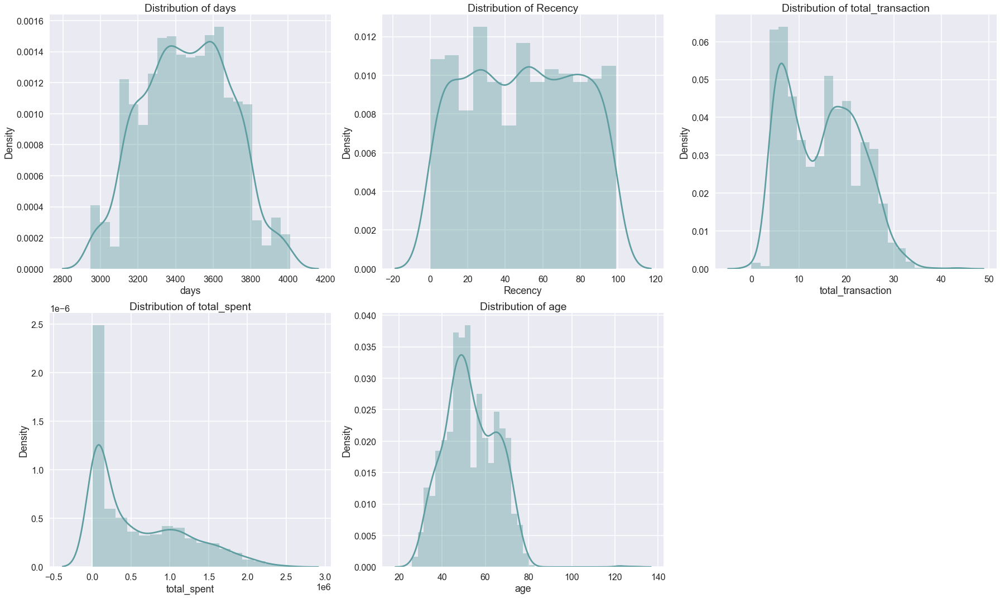

In [50]:
plt.figure(figsize=(25, 15))
for i in range(0, len(ls_feat)):
    plt.subplot(2,3, i+1)
    sns.distplot(df_p[ls_feat[i]], color='cadetblue')
    plt.title('Distribution of {}'.format(ls_feat[i]))
    plt.tight_layout()
plt.show()

Terdapat beberapa outliers dan distribusi dari fitur-fitur juga bersifat skew. Untuk handle hal tersebut akan dilakukan remove outliers dengan metode iqr.

In [51]:
df_iqr = df_p.copy()
outliers_cols_list = ls_feat

print(f'Jumlah baris sebelum memfilter outlier: {len(df_iqr)}')

filtered_entries = np.array([True] * len(df_iqr))

for col in outliers_cols_list:
    Q1 = df_iqr[col].quantile(0.25)
    Q3 = df_iqr[col].quantile(0.75)
    IQR = Q3 - Q1
    low_limit = Q1 - (IQR * 1.5)
    high_limit = Q3 + (IQR * 1.5)

    filtered_entries = ((df_iqr[col] >= low_limit) & (df_iqr[col] <= high_limit)) & filtered_entries
    
df_iqr = df_iqr[filtered_entries]

print(f'Jumlah baris setelah memfilter outlier: {len(df_iqr)}')
print(f'Jumlah data yang difilter: {round((len(df_p)-len(df_iqr))/len(df_p)*100, 2)}%')

Jumlah baris sebelum memfilter outlier: 2216
Jumlah baris setelah memfilter outlier: 2208
Jumlah data yang difilter: 0.36%


In [52]:
df_model = df_iqr[['days','Recency','total_transaction','total_spent','age']]
df_model.columns = ['L','R','F','M','C']
df_model.head(5)

,L,R,F,M,C
0,3919,58,25,1617000,65
1,3073,38,6,27000,68
2,3420,26,21,776000,57
3,3013,26,8,53000,38
4,3269,94,19,422000,41


In [53]:
df_model.describe()

,L,R,F,M,C
count,2208.000000,2208.000000,2208.000000,2.208000e+03,2208.000000
mean,3460.190670,49.035779,14.854620,6.034049e+05,53.121830
std,232.486969,28.960515,7.623989,5.980581e+05,11.682172
min,2948.000000,0.000000,0.000000,5.000000e+03,26.000000
25%,3288.000000,24.000000,8.000000,6.900000e+04,45.000000
50%,3461.000000,49.000000,15.000000,3.960000e+05,52.000000
75%,3634.000000,74.000000,21.000000,1.043250e+06,63.000000
max,4011.000000,99.000000,39.000000,2.486000e+06,82.000000


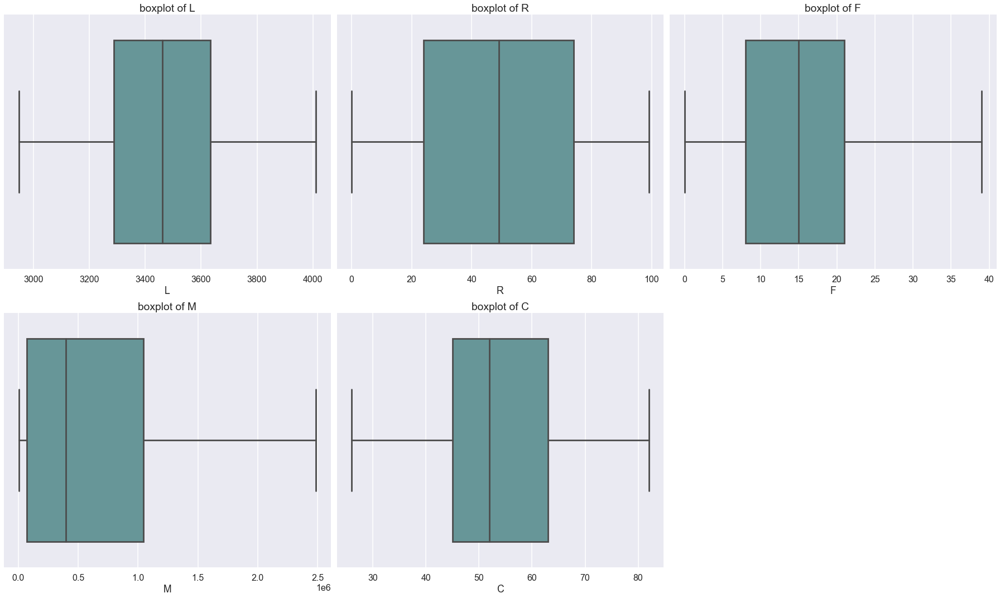

In [54]:
cols = df_model.columns

plt.figure(figsize=(25, 15))
for i in range(0, len(cols)):
    plt.subplot(2,3, i+1)
    sns.boxplot(df_model[cols[i]], color='cadetblue')
    plt.title('boxplot of {}'.format(cols[i]))
    plt.tight_layout()
plt.show()

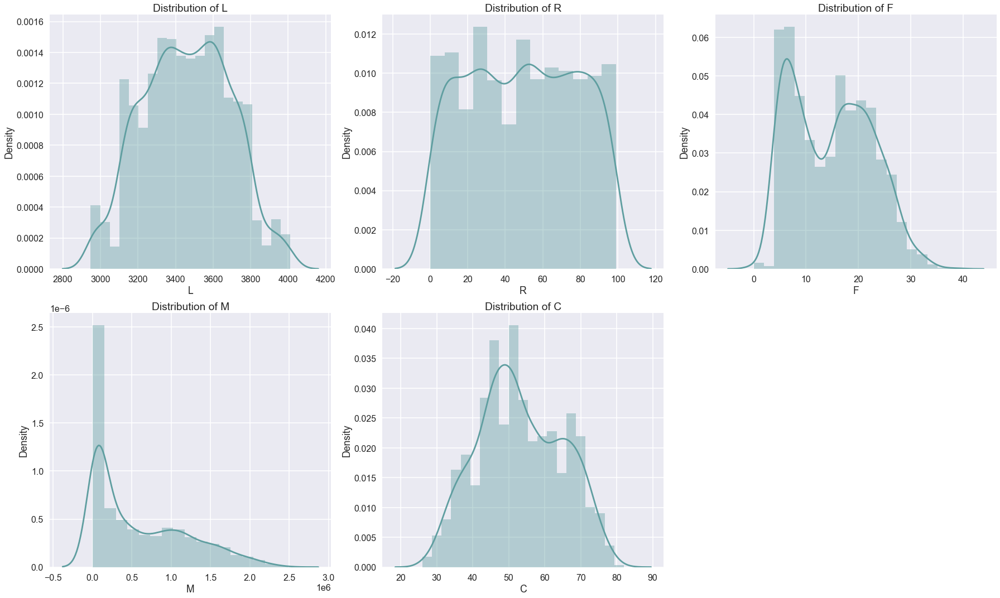

In [55]:
cols = df_model.columns
plt.figure(figsize=(25, 15))
for i in range(0, len(cols)):
    plt.subplot(2,3, i+1)
    sns.distplot(df_model[cols[i]], color='cadetblue')
    plt.title('Distribution of {}'.format(cols[i]))
    plt.tight_layout()
plt.show()

In [56]:
#skewness value
cols = df_model.columns
for i in range(0, len(cols)):
    print(f"Skewness {df_model[cols].columns[i]} : {df_model[cols[i]].skew()}")

Skewness L : 0.0020447766529193274
Skewness R : -0.0020350809795420125
Skewness F : 0.21793767447661386
Skewness M : 0.846596714154006
Skewness C : 0.09380992273794002


In [57]:
df_model.describe()

,L,R,F,M,C
count,2208.000000,2208.000000,2208.000000,2.208000e+03,2208.000000
mean,3460.190670,49.035779,14.854620,6.034049e+05,53.121830
std,232.486969,28.960515,7.623989,5.980581e+05,11.682172
min,2948.000000,0.000000,0.000000,5.000000e+03,26.000000
25%,3288.000000,24.000000,8.000000,6.900000e+04,45.000000
50%,3461.000000,49.000000,15.000000,3.960000e+05,52.000000
75%,3634.000000,74.000000,21.000000,1.043250e+06,63.000000
max,4011.000000,99.000000,39.000000,2.486000e+06,82.000000


dari informasi di atas dapat diketahui bahwa fitur L, R, F, dan C sudah menyerupai distribusi normal. Namun, fitur bersifat skew oleh karena itu akan dilkukan tranformasi log pada dua fitur ini.

In [58]:
df_LRFMC_log = df_model.copy()
df_LRFMC_log['M'] =  np.log(df_model['M'])
df_LRFMC_log

,L,R,F,M,C
0,3919,58,25,14.296083,65
1,3073,38,6,10.203592,68
2,3420,26,21,13.561908,57
3,3013,26,8,10.878047,38
4,3269,94,19,12.952761,41
...,...,...,...,...,...
2235,3489,46,18,14.108926,55
2236,3009,56,22,13.003580,76
2237,3263,91,19,14.031428,41
2238,3264,8,23,13.644722,66


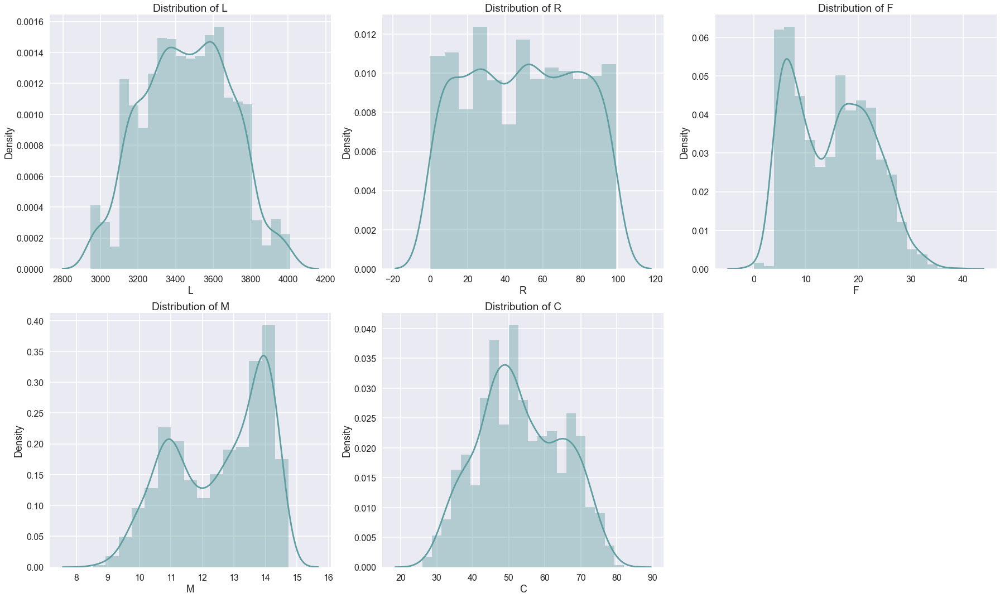

In [59]:
cols = df_LRFMC_log.columns

plt.figure(figsize=(25, 15))
for i in range(0, len(cols)):
    plt.subplot(2,3, i+1)
    sns.distplot(df_LRFMC_log[cols[i]], color='cadetblue')
    plt.title('Distribution of {}'.format(cols[i]))
    plt.tight_layout()
plt.show()

In [60]:
#skewness value
cols = df_LRFMC_log.columns
for i in range(0, len(cols)):
    print(f"Skewness {df_LRFMC_log[cols].columns[i]} : {df_LRFMC_log[cols[i]].skew()}")

Skewness L : 0.0020447766529193274
Skewness R : -0.0020350809795420125
Skewness F : 0.21793767447661386
Skewness M : -0.38793591305569614
Skewness C : 0.09380992273794002


In [61]:
df_LRFMC_log.describe()

,L,R,F,M,C
count,2208.000000,2208.000000,2208.000000,2208.000000,2208.000000
mean,3460.190670,49.035779,14.854620,12.516724,53.121830
std,232.486969,28.960515,7.623989,1.481339,11.682172
min,2948.000000,0.000000,0.000000,8.517193,26.000000
25%,3288.000000,24.000000,8.000000,11.141862,45.000000
50%,3461.000000,49.000000,15.000000,12.889169,52.000000
75%,3634.000000,74.000000,21.000000,13.857851,63.000000
max,4011.000000,99.000000,39.000000,14.726186,82.000000


Karena akan digunakan K-Means yang merupakan Machine learning berdasarkan jarak sehingga scalling data yang digunakan adalah standarisasi.

In [62]:
# Standardize data 
std = StandardScaler().fit_transform(df_LRFMC_log)
df_LRFMC_std = pd.DataFrame(std, columns = list(df_LRFMC_log))
df_LRFMC_std

,L,R,F,M,C
0,1.973931,0.309603,1.331020,1.201455,1.017008
1,-1.665807,-0.381149,-1.161679,-1.561868,1.273868
2,-0.172912,-0.795600,0.806241,0.705727,0.332049
3,-1.923944,-0.795600,-0.899289,-1.106464,-1.294730
4,-0.822558,1.552956,0.543852,0.294420,-1.037870
...,...,...,...,...,...
2203,0.123946,-0.104849,0.412657,1.075083,0.160809
2204,-1.941153,0.240527,0.937436,0.328734,1.958827
2205,-0.848372,1.449343,0.543852,1.022755,-1.037870
2206,-0.844069,-1.417277,1.068630,0.761644,1.102628


## Modelling

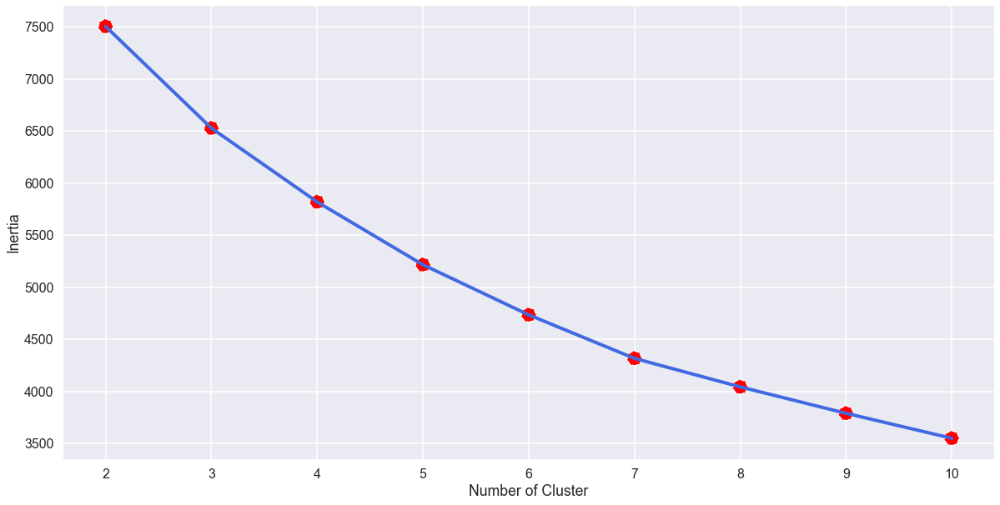

In [63]:
inertia = []

for i in range(2, 11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(df_LRFMC_std)
    inertia.append(kmeans.inertia_)


plt.figure(figsize=(20, 10))

sns.lineplot(x=range(2, 11), y=inertia, color='royalblue', linewidth = 4)
sns.scatterplot(x=range(2, 11), y=inertia, s=300, color='r',  linestyle='--')
plt.ylabel('Inertia')
plt.xlabel('Number of Cluster')
plt.show()

Dari grafik yang didapatkan terlihat bahwa jumlah cluster yang optimal adalah 4. Namun demikian perlu dilakukan evaluasi hasil cluster. Oleh karena itu dilakukan evaluasi hasil cluster dengan Sihouette Score

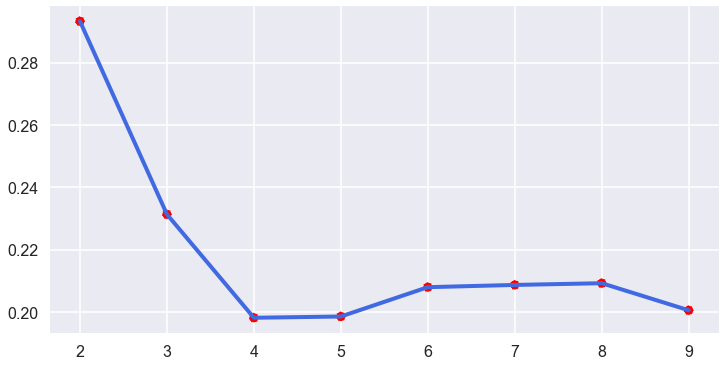

In [64]:
# we will check for 2 - 9 cluster

range_n_clusters = list(range(2,10))
arr_silhouette_score_euclidean = []
for i in range_n_clusters:
    kmeans = KMeans(n_clusters=i).fit(df_LRFMC_std)
    preds = kmeans.predict(df_LRFMC_std)
     
    score_euclidean = silhouette_score(df_LRFMC_std, preds, metric='euclidean')
    arr_silhouette_score_euclidean.append(score_euclidean)
    
    
fig, ax = plt.subplots(figsize=(12, 6))
sns.lineplot(x=range(2,10), y=arr_silhouette_score_euclidean, color='royalblue', linewidth = 4)
sns.scatterplot(x=range(2,10), y=arr_silhouette_score_euclidean, s=100, color='r',  linestyle='--')
plt.show()

Berdasarkan dari grafik Silhouette Score dapat dilihat bahwa jumlah cluster yang optimal adalah 4. Sehingga hasil dari elbow methods menunjukkan hasil yang sama dengan validasi.

### K-Means Model

In [65]:
# Create clusters using K-Means
kmeans = KMeans(n_clusters=4, random_state=0).fit(df_LRFMC_std)

# Assign Cluster
cluster = kmeans.labels_
df_LRFMC_std['clusters'] = cluster
df_model['clusters'] = cluster
df_iqr['clusters'] = cluster

# see cluster on data after IQR step
df_model.head()

,L,R,F,M,C,clusters
0,3919,58,25,1617000,65,0
1,3073,38,6,27000,68,3
2,3420,26,21,776000,57,0
3,3013,26,8,53000,38,3
4,3269,94,19,422000,41,2


In [66]:
# see cluster on data after std step
df_LRFMC_std.head()

,L,R,F,M,C,clusters
0,1.973931,0.309603,1.331020,1.201455,1.017008,0
1,-1.665807,-0.381149,-1.161679,-1.561868,1.273868,3
2,-0.172912,-0.795600,0.806241,0.705727,0.332049,0
3,-1.923944,-0.795600,-0.899289,-1.106464,-1.294730,3
4,-0.822558,1.552956,0.543852,0.294420,-1.037870,2


### PCA Plot

In [67]:
#PCA dengan component = 2
pca = PCA(n_components=2)

pca.fit(df_LRFMC_std)
pcs = pca.transform(df_LRFMC_std)

data_pca = pd.DataFrame(data = pcs, columns = ['PC 1', 'PC 2'])
data_pca['clusters'] = kmeans.labels_


<AxesSubplot: xlabel='PC 1', ylabel='PC 2'>

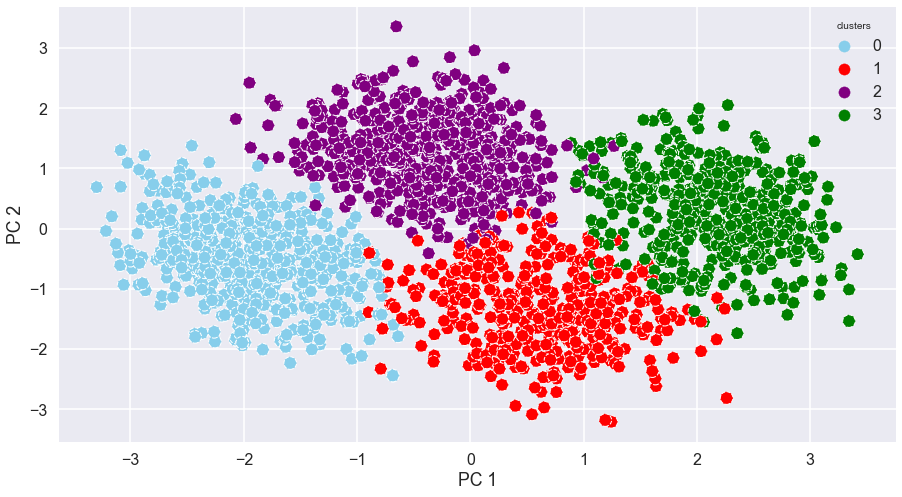

In [68]:
# Plot the cluster in scatterlot
fig, ax = plt.subplots(figsize=(15,8))

sns.scatterplot(
    x="PC 1", y="PC 2",
    hue="clusters",
    linestyle='--',
    data=data_pca,
    palette=['skyblue','red','purple','green'],
    s=160,
    ax=ax
)

Dari hasil scatterplot di atas dapat dikatakan bahwa jumlah cluster sama dengan 4 merupakan jumlah cluster yang tepat. Dimana dapat dilihat bahwa terlihat segmentasi yang cukup jelas antar clusternya

## Intrepretasi Clusters

In [69]:
# jumlah customer masing-masing cluster
dist_clus = df_LRFMC_std['clusters'].value_counts().reset_index()
dist_clus.columns = ['cluster','costumer']
dist_clus['percentage (%)'] = round((dist_clus['costumer']/(sum(dist_clus['costumer'])))*100,2)
dist_clus

,cluster,costumer,percentage (%)
0,2,646,29.26
1,0,590,26.72
2,3,506,22.92
3,1,466,21.11


In [70]:
# group data cluster berdasarkan mean
avg_cluster_mean = df_LRFMC_std.groupby('clusters').mean().reset_index(drop=True)
avg_cluster_mean

,L,R,F,M,C
0,-0.048743,-0.134820,0.696616,0.741244,1.079409
1,-0.239764,0.943953,-0.925754,-0.937363,-0.097705
2,0.358428,0.099757,0.802992,0.811072,-0.609373
3,-0.179952,-0.839489,-0.984851,-1.036512,-0.390644


In [71]:
# radar chart

import plotly.graph_objects as go

fig = go.Figure()

for i in range(4):
    fig.add_trace(go.Scatterpolar(r=avg_cluster_mean.loc[i].values.tolist() + avg_cluster_mean.loc[i].values.tolist()[:1],
                                  theta=avg_cluster_mean.columns.tolist() + avg_cluster_mean.columns.tolist()[:1],
                                  name="CLUSTER-%s"%avg_cluster_mean.index[i],
                                  showlegend=True))

fig.update_layout(polar=dict(radialaxis=dict(visible=True, range=[-1.5, 1.5])),title="Cluster - LRFMC (Mean)")
fig.update_layout(
    autosize=False,
    width=500,
    height=500,)

fig.show()

In [72]:
# melihat radarplot media untuk mengidentifikasi apakah memiliki
# pola yang sama dengan mean atau tidak

avg_cluster_med = df_LRFMC_std.groupby('clusters').median().reset_index(drop=True)
avg_cluster_med

,L,R,F,M,C
0,-0.061052,-0.087580,0.675046,0.827600,1.102628
1,-0.254655,0.965817,-1.030484,-0.973889,-0.181671
2,0.440164,0.171452,0.806241,0.884015,-0.524151
3,-0.269713,-0.864676,-1.030484,-1.057335,-0.438531


In [73]:
# radar chart
import plotly.graph_objects as go

fig = go.Figure()

for i in range(4):
    fig.add_trace(go.Scatterpolar(r=avg_cluster_med.loc[i].values.tolist() + avg_cluster_med.loc[i].values.tolist()[:1],
                                  theta=avg_cluster_med.columns.tolist() + avg_cluster_med.columns.tolist()[:1],
                                  name="CLUSTER-%s"%avg_cluster_med.index[i],
                                  showlegend=True))

fig.update_layout(polar=dict(radialaxis=dict(visible=True, range=[-1.5, 1.5])),title="Cluster - LRFMC (Median) ")
fig.update_layout(
    autosize=False,
    width=500,
    height=500,)

fig.show()

In [74]:
df_cluster = df_model.copy()
df_cluster

,L,R,F,M,C,clusters
0,3919,58,25,1617000,65,0
1,3073,38,6,27000,68,3
2,3420,26,21,776000,57,0
3,3013,26,8,53000,38,3
4,3269,94,19,422000,41,2
...,...,...,...,...,...,...
2235,3489,46,18,1341000,55,2
2236,3009,56,22,444000,76,0
2237,3263,91,19,1241000,41,2
2238,3264,8,23,843000,66,0


In [75]:
df_stat = df_cluster.groupby('clusters').agg(['mean','median','min','max'])
df_stat

L                              R                 \
                 mean  median   min   max       mean median min max   
clusters                                                              
0         3448.861017  3446.0  2949  4011  45.132203   46.5   0  99   
1         3404.461373  3401.0  2951  4011  76.366953   77.0  44  99   
2         3543.501548  3562.5  2949  4011  51.924149   54.0   0  99   
3         3418.363636  3397.5  2948  4011  24.729249   24.0   0  56   

                  F                            M                              \
               mean median min max          mean     median     min      max   
clusters                                                                       
0         20.164407   20.0  10  35  9.594153e+05   929500.0  138000  2440000   
1          7.798283    7.0   0  19  9.706652e+04    64500.0    5000   801000   
2         20.975232   21.0  10  39  1.051463e+06  1010500.0  119000  2486000   
3          7.347826    7.0   0  18  8.257905e+04    57000.0    6000   726000   

                  C                 
               mean median min max  
clusters                            
0         65.728814   66.0  52  81  
1         51.980687   51.0  26  82  
2         46.004644   47.0  27  65  
3         48.559289   48.0  26  77

Dari informasi di atas dapat diperloah bahwa:  
* Cluster 0 : High C, F, M ; Middle L, R
* Cluster 1 : Middle C; Low L, F, M, R
* Cluster 2 : High L, F, M ; Middle R; Low C
* Cluster 3 : High R; LOW L, F, M, C

**Interpretasi Clusters**  
* Cluster 0  
Cluster 0 merupakan kelompok kostumer yang merupakan kostumer dengan rata-rata usia 65 tahun, rata-rata transaksi atau pembelian yang banyak, dan juga cluster dengan total spent yang cukup tinggi. Kostumer ini dapat dibilang bahwa rata-rata bukan kostumer baru atau kostumer lama melainkan berada di pertengahan. Selain itu dari recency, cluster ini rata-rata memiliki jarak pembelian dari pembelian terakhir tidak begitu jauh. Cluster ini disebut sebagai Potential Loyalist.

* Cluster 1   
Cluster 1 merupakan cluster dengan rata-rata usia 51 tahun, rata-rata pendatang baru, rata-rata transaksi yang kecil, total spent yang kecil dan melakukan pembelian dari pembelian terakhir dalam rentang waktu  yang lama. Cluster ini dapat disebut sebagai Hibernating.

* Cluster 2  
Cluster 2 merupakan cluster dengan rata-rata usia 46 tahun. Cluster ini merupakan cluster dengan rata-rata pembelian dan juga total spent yang paling banyak. Dari recency, cluster ini termasuk yang melakukan pembelian dari pembelian terakhir dengan jarak yang cukup jauh. Selain itu rata-rata cluster ini terdiri dari customer lama. Cluster ini dapat disebut sebagai Can’t Lose Them.

* Cluster 3  
Cluster 3 merupakan cluster dengan rata-rata usia 48 tahun dan terdiri-dari rata-rata customer baru. Cluster ini merupakan cluster dengan rata-rata recency yang paling kecil artinya cluster ini melakukan pembelian dari pembelian terakhir dengan rata-rata jarak waktu yang berdekatan. Namun demikian, cluster ini merupakan cluster dengan jumlah pembelian dan total spent yang paling sedkit. Cluster ini dapat dikatakan sebagai Promising.

In [76]:
df_iqr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2208 entries, 0 to 2239
Data columns (total 33 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Education            2208 non-null   object        
 1   Marital_Status       2208 non-null   object        
 2   Income               2208 non-null   float64       
 3   Kidhome              2208 non-null   int64         
 4   Teenhome             2208 non-null   int64         
 5   Dt_Customer          2208 non-null   datetime64[ns]
 6   Recency              2208 non-null   int64         
 7   MntCoke              2208 non-null   int64         
 8   MntFruits            2208 non-null   int64         
 9   MntMeatProducts      2208 non-null   int64         
 10  MntFishProducts      2208 non-null   int64         
 11  MntSweetProducts     2208 non-null   int64         
 12  MntGoldProds         2208 non-null   int64         
 13  NumDealsPurchases    2208 non-nul

In [77]:
df_iqr['Cluster Name'] = np.where(df_iqr['clusters']==0, "Potential Loyalist",
                                (np.where(df_iqr['clusters']==1,"Hibernating",
                                (np.where(df_iqr['clusters']==2, "Can't Lose Them", "Promising")))))

Mari kita lihat insight berdasarkan cluster yang telah dibuat

In [78]:
cluster_group = df_iqr.groupby(['Cluster Name']).agg({'clusters':'count',
                                                        'total_spent': 'mean'}).reset_index()
cluster_group.columns = ['Cluster Name','Customers','Total Spent']
cluster_group['Percentage'] = round((cluster_group['Customers']/cluster_group['Customers'].sum())*100,2)
cluster_group['Percentage Spent'] = round((cluster_group['Total Spent']/cluster_group['Total Spent'].sum())*100,2)
cluster_group = cluster_group.sort_values('Percentage', ascending=False)
cluster_group

,Cluster Name,Customers,Total Spent,Percentage,Percentage Spent
0,Can't Lose Them,646,1.051463e+06,29.26,48.00
2,Potential Loyalist,590,9.594153e+05,26.72,43.80
3,Promising,506,8.257905e+04,22.92,3.77
1,Hibernating,466,9.706652e+04,21.11,4.43


(0.0, 32.0)

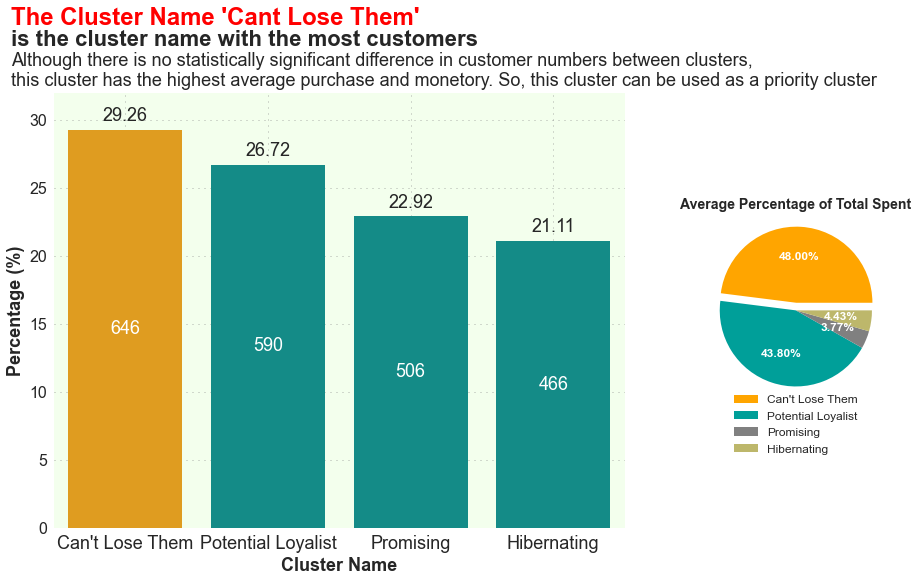

In [79]:
style.use('seaborn')
fig, ax = plt.subplots(1,2, figsize=(15, 8), gridspec_kw={'width_ratios': [3, 1]})

data = cluster_group['Percentage Spent']
keys = cluster_group['Cluster Name']
explode = [0.1, 0, 0, 0]
pall = ['orange', '#009f99','grey','darkkhaki']

cols1 = ['#009f99' if (x < max(cluster_group.Percentage)) else 'orange' for x in cluster_group.Percentage]
sns.barplot(ax =ax[0],x='Cluster Name', y='Percentage', data=cluster_group, palette=cols1)
patches, texts, pcts = ax[1].pie(data, colors=pall, 
            explode=explode, autopct='%.2f%%'
            )
plt.setp(pcts, color='white', fontsize = 12, fontweight='bold')
plt.setp(texts, fontsize = 14, fontweight=600)
plt.title('Average Percentage of Total Spent', fontsize = 14, fontweight='bold')
plt.legend(labels=keys, bbox_to_anchor=(0.5,-0.1), loc="center", fontsize=12)

ax[0].set_facecolor('#f3ffed')
ax[0].tick_params(axis='x', which='major', labelsize=18)
ax[0].tick_params(axis='y', which='major', labelsize=16)
ax[0].grid(which="major", axis="y", zorder=0, color="gray", linestyle=":", dashes=(1, 5), alpha=0.6)
ax[0].grid(which="major", axis="x", zorder=0, color="gray", linestyle=":", dashes=(1, 5), alpha=0.6)
ax[0].text(x=-0.8, y=37, s="The Cluster Name 'Cant Lose Them'", fontsize=24, fontweight='bold', c='red')
ax[0].text(x=-0.8, y=35.5, s="is the cluster name with the most customers", fontsize=22, fontweight='bold')
ax[0].text(x=-0.8, y=32.5, s="Although there is no statistically significant difference in customer numbers between clusters,\nthis cluster has the highest average purchase and monetory. So, this cluster can be used as a priority cluster ", fontsize=18)

ax[0].bar_label(ax[0].containers[0], fontsize=18, padding=5)
ax[0].bar_label(ax[0].containers[0],list(round(cluster_group['Customers'],2)), label_type='center', color='white', fontsize=18)

ax[0].set_xlabel('Cluster Name', fontsize=18, fontweight='bold')
ax[0].set_ylabel('Percentage (%)', fontsize=18, fontweight='bold')

ax[0].set_ylim(0, 32)

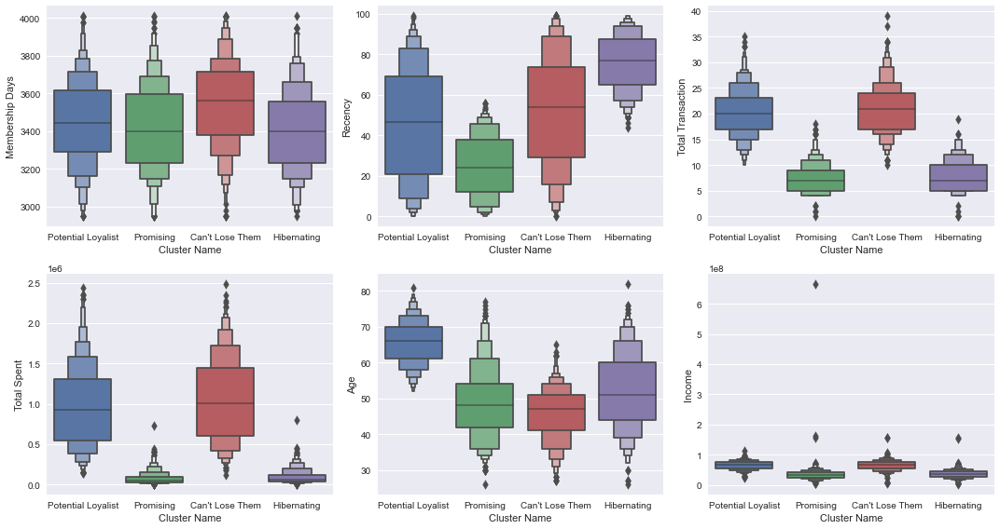

In [80]:
df_boxenplot = df_iqr[['days','Recency','total_transaction','total_spent','age','Income','Cluster Name']]
df_boxenplot.rename(columns={'Recency':'Recency','total_transaction':'Total Transaction','total_spent':'Total Spent','days':'Membership Days','age':'Age'}, inplace=True)
clust = df_boxenplot.columns.drop('Cluster Name')

plt.figure(figsize= (15, 8))
for i in range(len(clust)):
    plt.subplot(2,3, i+1)
    sns.boxenplot(x=df_boxenplot['Cluster Name'], y=df_boxenplot[clust[i]])
    plt.tight_layout()

Dapat dilihat bahwa cluster "Can't Lose Them' juga memiliki rata-rata income yang besar dibandingkan cluster yang lainnya. Mari kita lihat distribusi kelompok umur untuk masing-masing cluster.

In [81]:
df_age = df_iqr[['age_group','Cluster Name','age']]
df_age_group = df_age.groupby(['Cluster Name','age_group']).agg({'age':'count'}).reset_index()
df_age_group.rename(columns={'age_group':'Age Group','age':'Customers'},inplace=True)
df_age_group['Percentage'] = round((df_age_group['Customers']/df_age_group['Customers'].sum())*100,2)
df_age_group

,Cluster Name,Age Group,Customers,Percentage
0,Can't Lose Them,Middle Senior,1,0.05
1,Can't Lose Them,Older Middle-Age,68,3.08
2,Can't Lose Them,Prime Adulthood,239,10.82
3,Can't Lose Them,Younger Middle-Age,338,15.31
4,Hibernating,Late Senior,5,0.23
5,Hibernating,Middle Senior,67,3.03
6,Hibernating,Older Middle-Age,113,5.12
7,Hibernating,Prime Adulthood,123,5.57
8,Hibernating,Younger Middle-Age,158,7.16
9,Potential Loyalist,Late Senior,47,2.13


In [82]:
def perctsym(df):
    lst = []
    for i in (df):
        gec = str(i) + '%'
        lst.append(gec)
    return lst

In [83]:
ls = perctsym(df_age_group['Percentage'][df_age_group['Age Group']=='Late Senior'])
ms = perctsym(df_age_group['Percentage'][df_age_group['Age Group']=='Middle Senior'])
oma = perctsym(df_age_group['Percentage'][df_age_group['Age Group']=='Older Middle-Age'])
pa = perctsym(df_age_group['Percentage'][df_age_group['Age Group']=='Prime Adulthood'])
yma = perctsym(df_age_group['Percentage'][df_age_group['Age Group']=='Younger Middle-Age'])

In [84]:
print(ls)
print(ms)
print(oma)
print(pa)
print(yma)

['0.23%', '2.13%', '0.14%']
['0.05%', '3.03%', '13.36%', '1.77%']
['3.08%', '5.12%', '10.28%', '3.4%']
['10.82%', '5.57%', '8.2%']
['15.31%', '7.16%', '0.95%', '9.42%']


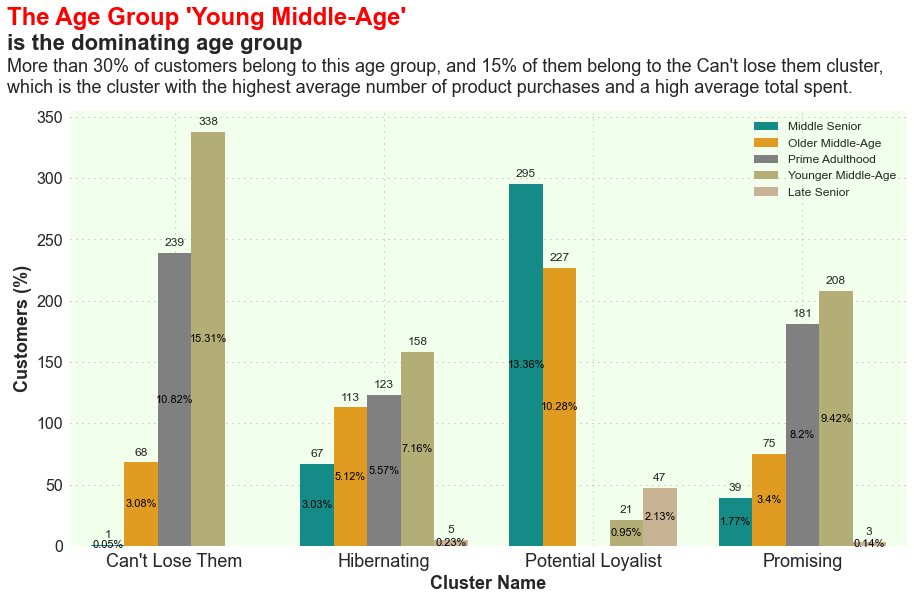

In [85]:
style.use('seaborn')
fig, ax = plt.subplots(figsize=(15, 8))

cols1 = ['#009f99','orange','Grey','darkkhaki','tan']
sns.barplot(ax=ax,x='Cluster Name', y='Customers', hue='Age Group', data=df_age_group, palette=cols1)

ax.set_facecolor('#f3ffed')
ax.tick_params(axis='x', which='major', labelsize=18)
ax.tick_params(axis='y', which='major', labelsize=16)
ax.grid(which="major", axis="y", zorder=0, color="gray", linestyle=":", dashes=(1, 5), alpha=0.6)
ax.grid(which="major", axis="x", zorder=0, color="gray", linestyle=":", dashes=(1, 5), alpha=0.6)
ax.text(x=-0.8, y=425, s="The Age Group 'Young Middle-Age'", fontsize=24, fontweight='bold', c='red')
ax.text(x=-0.8, y=405, s="is the dominating age group", fontsize=22, fontweight='bold')
ax.text(x=-0.8, y=370, s="More than 30% of customers belong to this age group, and 15% of them belong to the Can't lose them cluster,\nwhich is the cluster with the highest average number of product purchases and a high average total spent. ", fontsize=18)

ax.bar_label(ax.containers[0], fontsize=12, padding=5)
ax.bar_label(ax.containers[1], fontsize=12, padding=5)
ax.bar_label(ax.containers[2], fontsize=12, padding=5)
ax.bar_label(ax.containers[3], fontsize=12, padding=5)
ax.bar_label(ax.containers[4], fontsize=12, padding=5)

ax.bar_label(ax.containers[0], ['0.05%', '3.03%', '13.36%', '1.77%'], label_type='center', color='black', fontsize=11)
ax.bar_label(ax.containers[1],['3.08%', '5.12%', '10.28%', '3.4%'], label_type='center', color='black', fontsize=11)
ax.bar_label(ax.containers[2],['10.82%', '5.57%', '0%', '8.2%'], label_type='center', color='black', fontsize=11)
ax.bar_label(ax.containers[3],['15.31%', '7.16%', '0.95%', '9.42%'], label_type='center', color='black', fontsize=11)
ax.bar_label(ax.containers[4],['0%','0.23%', '2.13%', '0.14%'], label_type='center', color='black', fontsize=11)
ax.set_xlabel('Cluster Name', fontsize=18, fontweight='bold')
ax.set_ylabel('Customers (%)', fontsize=18, fontweight='bold')
ax.legend(fontsize = 12)

# ax[0].set_ylim(0, 32)

Mari kita lihat income dari masing-masing customer.

In [86]:
df_joinplot = df_iqr[['days','Recency','total_transaction','total_spent','age','Income','conversion_rate','Cluster Name']]
df_joinplot.rename(columns={'Recency':'Recency','total_transaction':'Total Transaction','total_spent':'Total Spent','days':'Membership Days','age':'Age','conversion_rate':'Converison Rate'}, inplace=True)
df_joinplot

,Membership Days,Recency,Total Transaction,Total Spent,Age,Income,Converison Rate,Cluster Name
0,3919,58,25,1617000,65,58138000.0,3.571429,Potential Loyalist
1,3073,38,6,27000,68,46344000.0,1.200000,Promising
2,3420,26,21,776000,57,71613000.0,5.250000,Potential Loyalist
3,3013,26,8,53000,38,26646000.0,1.333333,Promising
4,3269,94,19,422000,41,58293000.0,3.800000,Can't Lose Them
...,...,...,...,...,...,...,...,...
2235,3489,46,18,1341000,55,61223000.0,3.600000,Can't Lose Them
2236,3009,56,22,444000,76,64014000.0,3.142857,Potential Loyalist
2237,3263,91,19,1241000,41,56981000.0,3.166667,Can't Lose Them
2238,3264,8,23,843000,66,69245000.0,7.666667,Potential Loyalist


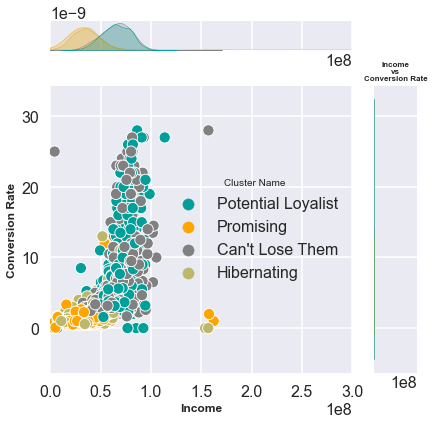

In [101]:
# Income vs conversion Rate
style.use('seaborn-v0_8-poster')
cols1 = ['#009f99','orange','Grey','darkkhaki']
plot = sns.jointplot(y = "Converison Rate", x = "Income", hue="Cluster Name",
              kind = "scatter", data = df_joinplot, palette=cols1,
              dropna = True)
plot.ax_marg_x.set_xlim(0, 300000000)
plot.ax_marg_y.set_xlim(0, 300000000)
plot.ax_joint.set_xlabel('Income', fontweight='bold', fontsize=12)
plot.ax_joint.set_ylabel('Conversion Rate', fontweight='bold', fontsize=12)
plt.title('Income\nvs\nConversion Rate', fontsize=8, weight='bold')
plot.figure.tight_layout() 


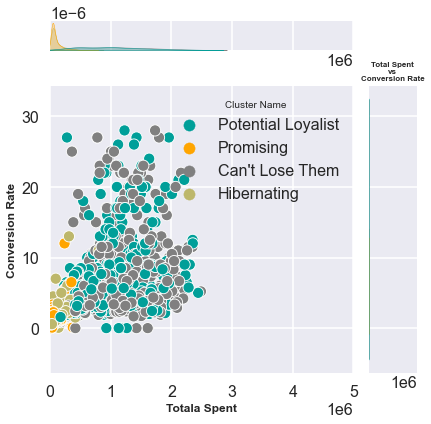

In [111]:
# Total Spent vs conversion Rate
style.use('seaborn-v0_8-poster')
cols1 = ['#009f99','orange','Grey','darkkhaki']
plot = sns.jointplot(y = "Converison Rate", x = "Total Spent", hue="Cluster Name",
              kind = "scatter", data = df_joinplot, palette=cols1,
              dropna = True)
plot.ax_marg_x.set_xlim(0, 5000000)
plot.ax_marg_y.set_xlim(0, 5000000)
plot.ax_joint.set_xlabel('Totala Spent', fontweight='bold', fontsize=12)
plot.ax_joint.set_ylabel('Conversion Rate', fontweight='bold', fontsize=12)
plt.title('Total Spent\nvs\nConversion Rate', fontsize=8, weight='bold')
plot.figure.tight_layout() 

### Business Strategy Recomendations

1. Cluster Potential Loyalist\
Karena customer pada cluster ini merupakan custer yang cukup banyak melakukan pembelian dan total uang yang dikeluarkan juga banyak. Maka pada cluster ini dapat diberikan loyalti program. Selain itu, karena pada cluster ini customer memiliki jarak ke pembelian selanjutnya yang tidak begitu jauh, maka untuk meningkat aktivitas recency maka dapat menawarkan produk-produk kepada cluster ini.  
2. Cluster Promising
Karena customer pada cluster ini merupakan cluster dengan pendatang baru dan melakukan pembelian yang cukup kecil, strategi yang dapat diterapkan adalah memberikan kesempatan seperti penawaran agar cutomer ini tertarik melakukan pembelian (brand awareness).  
3. Cluster Can't Lose Them
Cluster ini merupakan cluster yang paling banyak melakukan pembelian produk dan juga total uang yang dikeluarkan juga banyak. Customer pada cluster ini merupakan cluster yang paling potensial dan memberikan keuntungan yang tinggi. Selain itu jumlah customer pada cluster ini juga paling banyak. Akan tetapi customer pada cluster ini melakukan pembelian setelah pembelian terakhit cukup jauh. Oleh karean itu, strategi yang dapat dilakukan adalah menghubungi dan memberikan penawaran kepada cluster ini sehingga dapat menarik mereka untuk melakukan pembelian dapat berupa produk yang sesuai dengan kebanyakan usia pada cluster ini dan juga pemberian diskon.  
4. Cluster Hibernating
Cluster ini merupakan cluster dengan pembelian dan total uang yang dikeluarkan yang kecil. Selain itu, jarak pembelian terakhir ke pembelian selanjutnya juga jauh. Strategi yang dapat dilakukan adalah memberikan penawaran khusus dan produk yang relevan dengan customer pada cluster ini (sesuai dengan usia customer pada cluster ini).

Dari beberapa strategi di atas dua cluster yang dapat diutamakan adalah Cluster Potential Loyalist dan Cluster Can't Lose Them. Karena Kedua cluster ini merupakan cluster yang paling banyak melakukan pembelian dan total uang yang dihabiskan. Dengan total customer dari kedua cluster ini adalah lebih dari 55% dari total customer dan total spent lebih dari 80% sehingga kedua cluster ini dapat dijadikan fokus utama.